In [298]:
import numpy as np
import pandas as pd
import matplotlib as plt
import matplotlib.pyplot as plt
import seaborn as sns

In [299]:
night = pd.read_csv('night.csv', sep=',')

In [300]:
night.head(2)

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,...,start_hour,started_at_morning,started_at_midday,started_at_evening,end_hour,ended_at_morning,ended_at_midday,ended_at_evening,night_trips_start,night_trips_end
0,5CB9DFCECF79AF84,classic_bike,2021-01-01 00:08:33,2021-01-01 00:33:53,MAINE AVE & 9TH ST SW,0.0,ROSSLYN METRO / WILSON BLVD & FT MYER DR,0.0,38.880440,-77.025236,...,0,0,0,0,0,0,0,0,1,1
1,629E059504606547,electric_bike,2021-01-01 00:13:43,2021-01-01 00:29:34,10TH & U ST NW,0.0,NaN,0.0,38.917193,-77.025894,...,0,0,0,0,0,0,0,0,1,1


In [301]:
night.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 887594 entries, 0 to 887593
Data columns (total 28 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   ride_id             887594 non-null  object 
 1   rideable_type       887594 non-null  object 
 2   started_at          887594 non-null  object 
 3   ended_at            887594 non-null  object 
 4   start_station_name  799017 non-null  object 
 5   start_station_id    887593 non-null  float64
 6   end_station_name    780198 non-null  object 
 7   end_station_id      887593 non-null  float64
 8   start_lat           887593 non-null  float64
 9   start_lng           887593 non-null  float64
 10  end_lat             883943 non-null  float64
 11  end_lng             883943 non-null  float64
 12  member_casual       887594 non-null  object 
 13  year                887594 non-null  int64  
 14  month               887594 non-null  object 
 15  weekday_start_at    887594 non-nul

In [302]:
night_full=night.copy()

# Filter for only start trip 22pm-5am

In [303]:
mask_start = (night['start_hour'] >= 22) | (night['start_hour'] < 5)

# Apply the mask to filter the DataFrame
night = night[mask_start]

In [304]:
night['start_hour'].value_counts()

start_hour
22    296393
23    202293
0     118580
1      74018
2      46797
3      25407
4      21890
Name: count, dtype: int64

# Classic bike is the same a docked bike, correct the name

In [305]:
night['rideable_type'] = night['rideable_type'].replace('docked_bike', 'classic_bike')

In [306]:
night['rideable_type'].value_counts()

rideable_type
classic_bike     549467
electric_bike    235911
Name: count, dtype: int64

# Data cleaning, correcting most popular station name

In [307]:
night['start_station_name']=night['start_station_name'].replace('14TH ST & RHODE ISLAND AVE NW', '14TH & RHODE ISLAND AVE NW')

In [308]:
night.columns

Index(['ride_id', 'rideable_type', 'started_at', 'ended_at',
       'start_station_name', 'start_station_id', 'end_station_name',
       'end_station_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'member_casual', 'year', 'month', 'weekday_start_at', 'trip_duration',
       'season', 'start_hour', 'started_at_morning', 'started_at_midday',
       'started_at_evening', 'end_hour', 'ended_at_morning', 'ended_at_midday',
       'ended_at_evening', 'night_trips_start', 'night_trips_end'],
      dtype='object')

## Checking the names

In [313]:
# Count unique values in the column
unique_counts = night['start_station_name'].value_counts()

# Create a new DataFrame from the unique counts Series
new_df = unique_counts.reset_index()
new_df.columns = ['Value', 'Count']

# Save the new DataFrame to a new CSV file
new_df.to_csv('unique_counts.csv', index=False)

## Change the ended_at and started_at to datetime

In [314]:
night['ended_at'] = pd.to_datetime(night['ended_at']) 
night['started_at'] = pd.to_datetime(night['started_at']) 

In [315]:
night['weekday_ended_at'] = night['ended_at'].dt.day_name()  # Monday=0, Sunday=6

# measuring the distance

In [316]:
import numpy as np

def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Calculate the great-circle distance between two points 
    on the Earth's surface using the Haversine formula.
    
    Parameters:
        lat1, lon1: Latitude and longitude of point 1 (in degrees)
        lat2, lon2: Latitude and longitude of point 2 (in degrees)
        
    Returns:
        Distance between the two points (in kilometers)
    """
    # Convert latitude and longitude from degrees to radians
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    
    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    # Radius of the Earth in kilometers
    r = 6371.0
    # Calculate the distance
    distance = r * c
    return distance



In [317]:
night.info()

<class 'pandas.core.frame.DataFrame'>
Index: 785378 entries, 0 to 887593
Data columns (total 29 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   ride_id             785378 non-null  object        
 1   rideable_type       785378 non-null  object        
 2   started_at          785378 non-null  datetime64[ns]
 3   ended_at            785378 non-null  datetime64[ns]
 4   start_station_name  704232 non-null  object        
 5   start_station_id    785377 non-null  float64       
 6   end_station_name    688359 non-null  object        
 7   end_station_id      785377 non-null  float64       
 8   start_lat           785377 non-null  float64       
 9   start_lng           785377 non-null  float64       
 10  end_lat             783359 non-null  float64       
 11  end_lng             783359 non-null  float64       
 12  member_casual       785378 non-null  object        
 13  year                785378 non-nul

In [318]:
# Calculate distance using the haversine_distance function
night['distance_km'] = haversine_distance(night['start_lat'], night['start_lng'], night['end_lat'], night['end_lng'])


# cleaning the rideable_type column

In [319]:
# Remove "_bike" from all values in the column
night['rideable_type']=night['rideable_type'].replace('classic_bike', 'classic')
night['rideable_type']=night['rideable_type'].replace('electric_bike', 'electric')

In [320]:
night.head(1)

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,...,started_at_midday,started_at_evening,end_hour,ended_at_morning,ended_at_midday,ended_at_evening,night_trips_start,night_trips_end,weekday_ended_at,distance_km
0,5CB9DFCECF79AF84,classic,2021-01-01 00:08:33,2021-01-01 00:33:53,MAINE AVE & 9TH ST SW,0.0,ROSSLYN METRO / WILSON BLVD & FT MYER DR,0.0,38.88044,-77.025236,...,0,0,0,0,0,0,1,1,Friday,4.367593


# Plot: number of rides per bike type and year

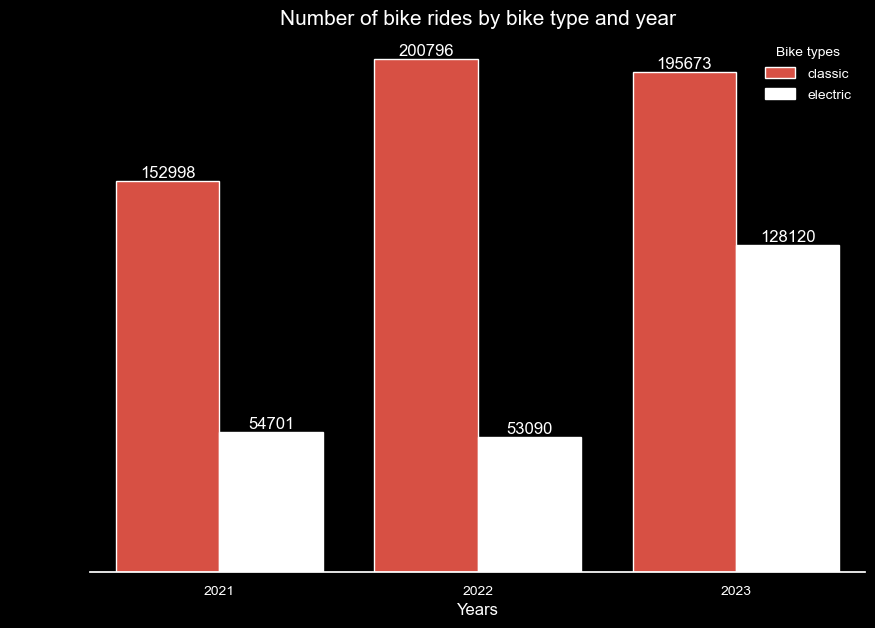

In [321]:
sns.set_theme(rc={'axes.facecolor':'black', 'figure.facecolor':'black', 'grid.color': 'black' })
gabi_white_purple=['#ef3b2c', 'white']
fig , ax = plt.subplots (figsize = (10,7))
sns.countplot(data=night, x='year', hue='rideable_type', palette=gabi_white_purple)
plt.title('Number of bike rides by bike type and year', fontsize=15, color='white')
plt.xticks(fontsize=10, color='white')
plt.yticks(fontsize=10, color='black')
plt.xlabel('Years', color='white')
plt.ylabel('Count', color='black')
plt.setp(ax.get_legend().get_texts(), fontsize='10', color='white') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='10', color='white') # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title("Bike types")
# Iterate over each container and add labels to each category
for container in ax.containers:
    ax.bar_label(container, color='white')
sns.despine(left=True)

# Plot: number of rides per user type and year

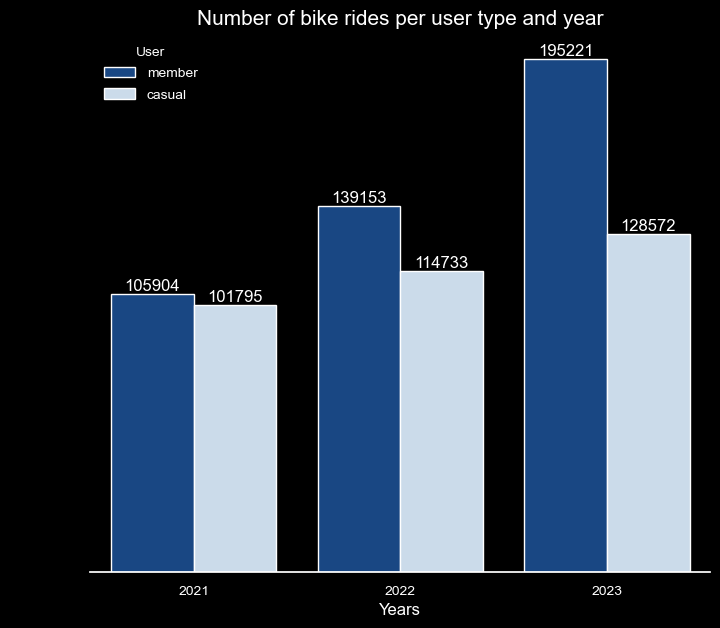

In [322]:
sns.set_theme(rc={'axes.facecolor':'black', 'figure.facecolor':'black', 'grid.color': 'black' })
gabi=['#084594', '#c6dbef']
fig , ax = plt.subplots (figsize = (8,7))
sns.countplot(data=night, x='year', hue='member_casual', palette=gabi)
plt.title('Number of bike rides per user type and year', fontsize=15, color='white')
plt.xticks(fontsize=10, color='white')
plt.yticks(fontsize=10, color='black')
plt.xlabel('Years', color='white')
plt.ylabel('Count', color='black')
plt.setp(ax.get_legend().get_texts(), fontsize='10', color='white') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='10', color='white') # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title("User")
# Iterate over each container and add labels to each category
for container in ax.containers:
    ax.bar_label(container, color='white')
sns.despine(left=True)

In [323]:
night.columns

Index(['ride_id', 'rideable_type', 'started_at', 'ended_at',
       'start_station_name', 'start_station_id', 'end_station_name',
       'end_station_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'member_casual', 'year', 'month', 'weekday_start_at', 'trip_duration',
       'season', 'start_hour', 'started_at_morning', 'started_at_midday',
       'started_at_evening', 'end_hour', 'ended_at_morning', 'ended_at_midday',
       'ended_at_evening', 'night_trips_start', 'night_trips_end',
       'weekday_ended_at', 'distance_km'],
      dtype='object')

# Plot: AVG bike rider per weekday and bike type

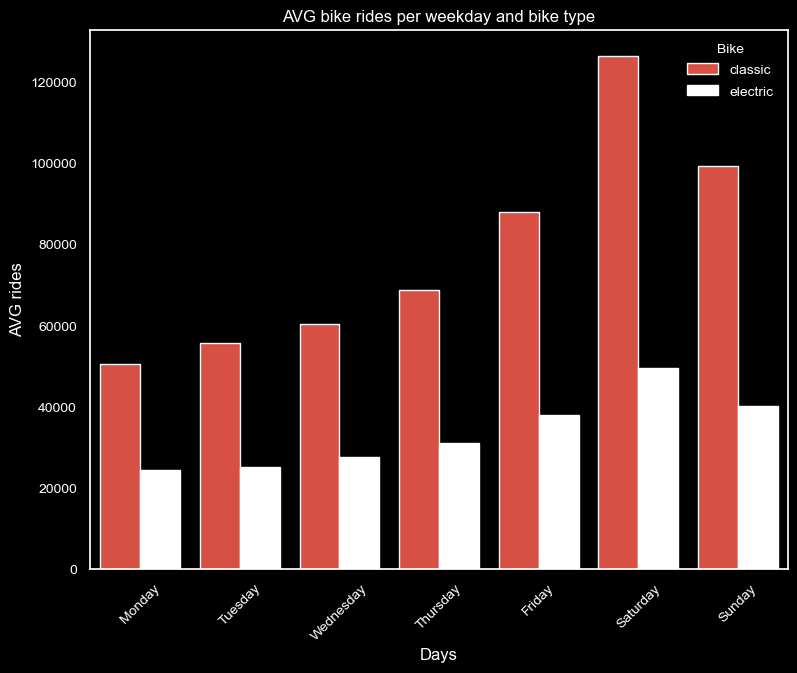

In [328]:
import seaborn as sns
import matplotlib.pyplot as plt

order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Assuming you have a DataFrame called rides_data
# that contains ride information including user type and weekday
# Count the number of rides for each combination of weekday and user type
rides_count = night.groupby(['weekday_start_at', 'rideable_type']).size().reset_index(name='ride_count')

# Calculate average rides per weekday and user type
average_rides = rides_count.groupby(['weekday_start_at', 'rideable_type'])['ride_count'].mean().reset_index()

# Plotting

fig , ax = plt.subplots (figsize = (9,7))
sns.barplot(x='weekday_start_at', y='ride_count', hue='rideable_type', data=average_rides, order=order, palette=gabi_white_purple)

plt.xticks(fontsize=10, color='white', rotation=45)
plt.yticks(fontsize=10, color='white')
plt.title('AVG bike rides per weekday and bike type', color='white')
plt.xlabel('Days', color='white')
plt.ylabel('AVG rides', color='white')


plt.setp(ax.get_legend().get_texts(), fontsize='10', color='white') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='10', color='white') # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title("Bike")


# Plot: avg per day and user type

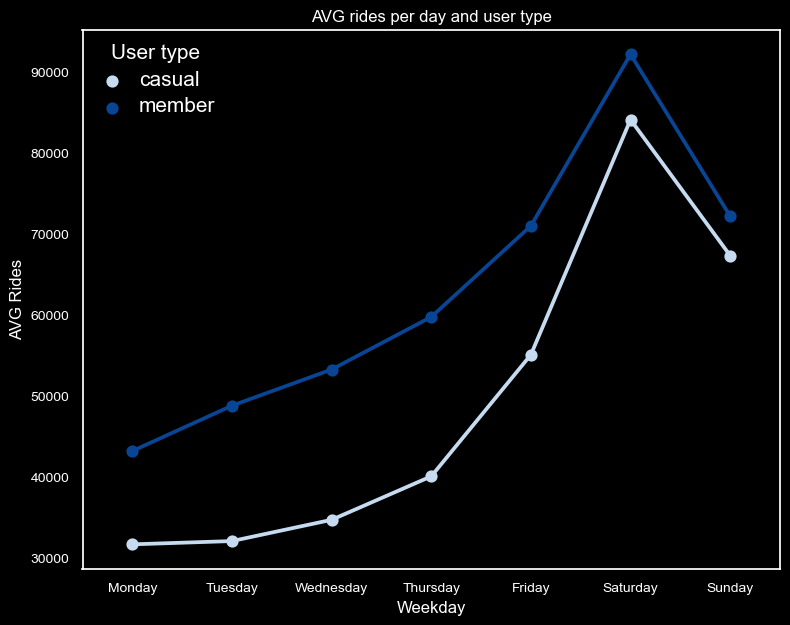

In [329]:
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.set_theme(rc={'axes.facecolor':'black', 'figure.facecolor':'black', 'grid.color': 'black' })
fig , ax = plt.subplots (figsize = (9,7))

gabi_r=['#c6dbef', '#084594']


rides_count_2 = night.groupby(['weekday_start_at', 'member_casual']).size().reset_index(name='ride_count')

sns.pointplot(x='weekday_start_at', y='ride_count', hue='member_casual', scale=1, errwidth=15, data=rides_count_2, order=weekday_order, palette=gabi_r)
plt.xticks(fontsize=10, color='white')
plt.yticks(fontsize=10, color='white')
plt.title('AVG rides per day and user type', color='white')
plt.xlabel('Weekday', color='white')
plt.ylabel('AVG Rides', color='white')


plt.setp(ax.get_legend().get_texts(), fontsize='15', color='white') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='15', color='white') # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title("User type")

# Plot: avg rides per user type and hour

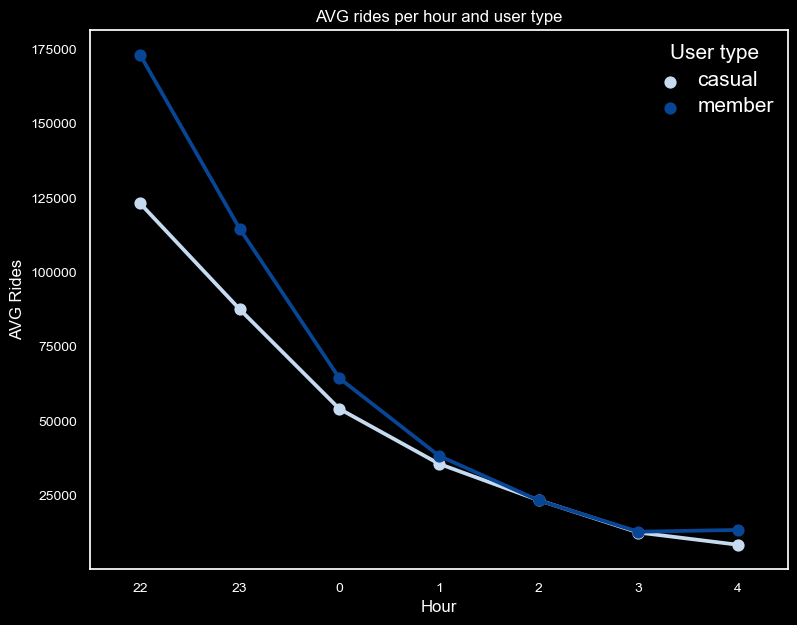

In [330]:
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.set_theme(rc={'axes.facecolor':'black', 'figure.facecolor':'black', 'grid.color': 'black' })
fig , ax = plt.subplots (figsize = (9,7))

gabi_r=['#c6dbef', '#084594']

hour_order=[22, 23, 0, 1, 2, 3, 4]

rides_count_13 = night.groupby(['start_hour', 'member_casual']).size().reset_index(name='ride_count')

sns.pointplot(x='start_hour', y='ride_count', hue='member_casual', scale=1, errwidth=15, data=rides_count_13, order=hour_order, palette=gabi_r)
plt.xticks(fontsize=10, color='white')
plt.yticks(fontsize=10, color='white')
plt.title('AVG rides per hour and user type', color='white')
plt.xlabel('Hour', color='white')
plt.ylabel('AVG Rides', color='white')


plt.setp(ax.get_legend().get_texts(), fontsize='15', color='white') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='15', color='white') # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title("User type")

# Plot: avg rides per season and bike type

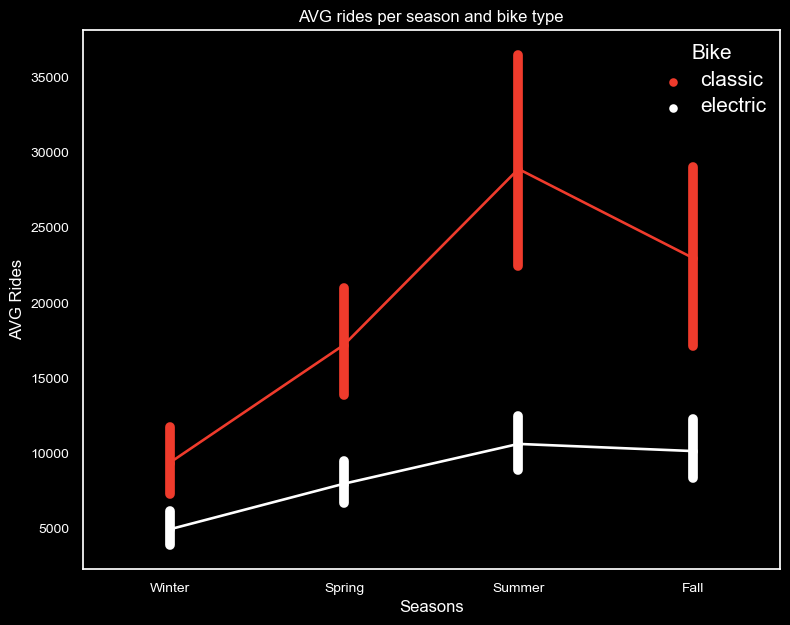

In [331]:
season_order = ['Winter', 'Spring', 'Summer', 'Fall']
sns.set_theme(rc={'axes.facecolor':'black', 'figure.facecolor':'black', 'grid.color': 'black' })
fig , ax = plt.subplots (figsize = (9,7))

rides_count_3 = night.groupby(['weekday_start_at', 'rideable_type', 'season']).size().reset_index(name='ride_count')

sns.pointplot(x='season', y='ride_count', hue='rideable_type', scale=0.7, errwidth=7, data=rides_count_3, order=season_order, palette=gabi_white_purple)
plt.xticks(fontsize=10, color='white')
plt.yticks(fontsize=10, color='white')
plt.title('AVG rides per season and bike type', color='white')
plt.xlabel('Seasons', color='white')
plt.ylabel('AVG Rides', color='white')


plt.setp(ax.get_legend().get_texts(), fontsize='15', color='white') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='15', color='white') # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title("Bike")

# Plot: avg rides per season and user type

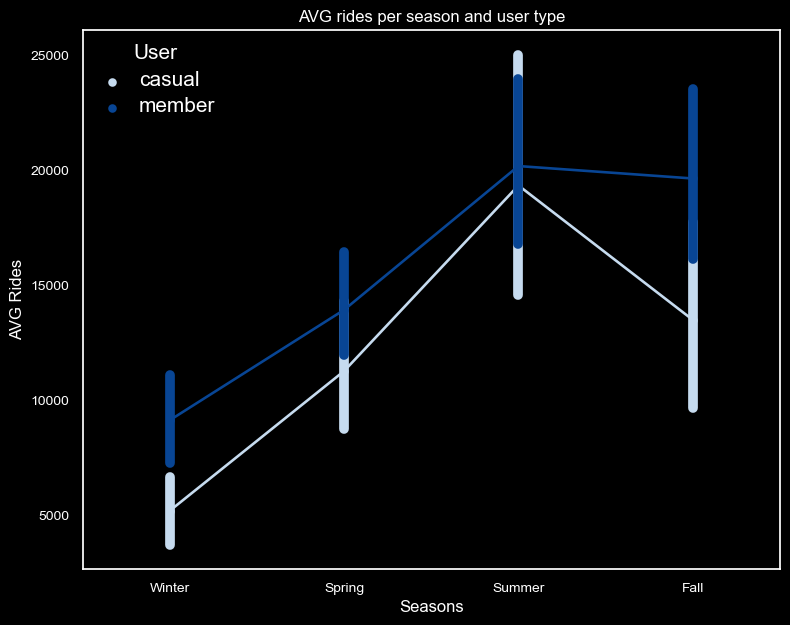

In [332]:
season_order = ['Winter', 'Spring', 'Summer', 'Fall']
sns.set_theme(rc={'axes.facecolor':'black', 'figure.facecolor':'black', 'grid.color': 'black' })
fig , ax = plt.subplots (figsize = (9,7))

rides_count_4 = night.groupby(['weekday_start_at', 'member_casual', 'season']).size().reset_index(name='ride_count')

sns.pointplot(x='season', y='ride_count', hue='member_casual', scale=0.7, errwidth=7, data=rides_count_4, order=season_order, palette=gabi_r)
plt.xticks(fontsize=10, color='white')
plt.yticks(fontsize=10, color='white')
plt.title('AVG rides per season and user type', color='white')
plt.xlabel('Seasons', color='white')
plt.ylabel('AVG Rides', color='white')


plt.setp(ax.get_legend().get_texts(), fontsize='15', color='white') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='15', color='white') # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title("User")

# Plot: avg ride per season and year

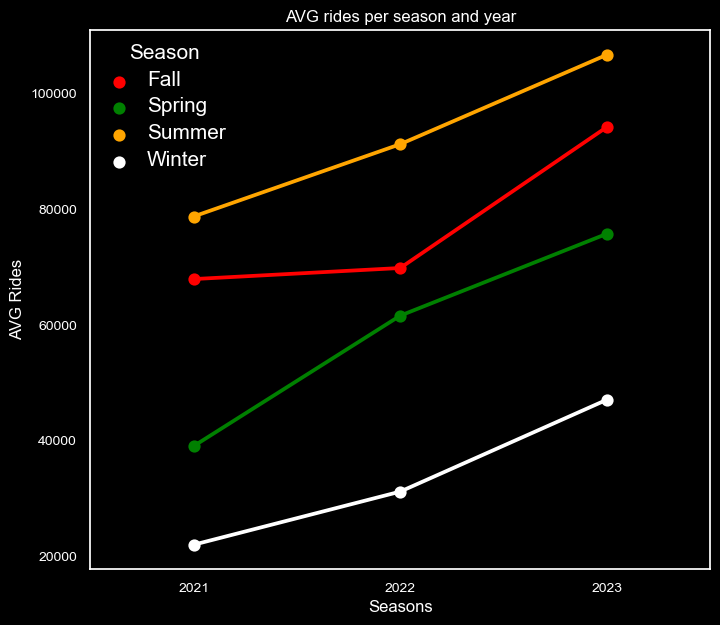

In [333]:

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have the necessary data loaded and processed

# Adjusting color settings
sns.set_theme(rc={'axes.facecolor': 'black', 'figure.facecolor': 'black', 'grid.color': 'black'})

# Data preprocessing and plotting
fig, ax = plt.subplots(figsize=(8, 7))
rides_count_5 = night.groupby(['year', 'season']).size().reset_index(name='ride_count')
season_color = ['red', 'green', 'orange', 'white']

sns.pointplot(x='year', y='ride_count', hue='season', data=rides_count_5, palette=season_color)

# Customizing plot appearance
plt.xticks(fontsize=10, color='white')
plt.yticks(fontsize=10, color='white')
plt.title('AVG rides per season and year', color='white')
plt.xlabel('Seasons', color='white')
plt.ylabel('AVG Rides', color='white')
plt.setp(ax.get_legend().get_texts(), fontsize='15', color='white')  # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='15', color='white')  # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title("Season")
plt.show()

# Plot: avg ride per weekday and season

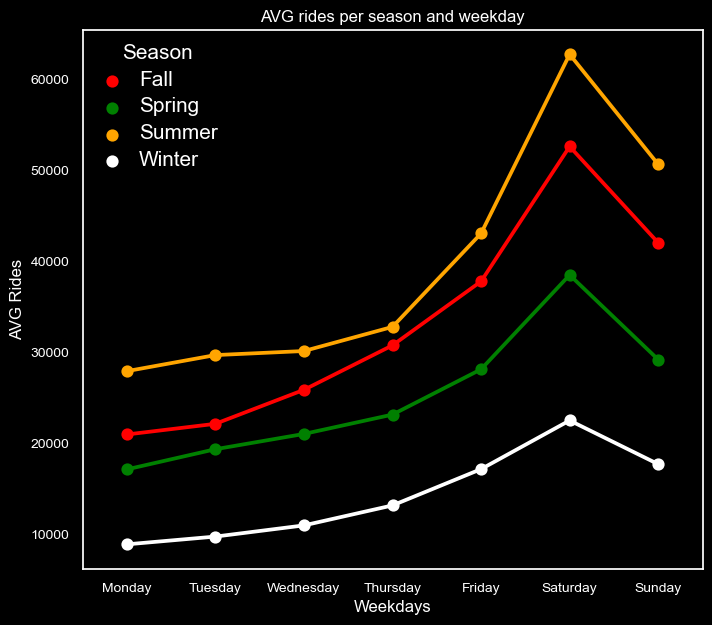

In [334]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have the necessary data loaded and processed
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
# Adjusting color settings
sns.set_theme(rc={'axes.facecolor': 'black', 'figure.facecolor': 'black', 'grid.color': 'black'})

# Data preprocessing and plotting
fig, ax = plt.subplots(figsize=(8, 7))
rides_count_6 = night.groupby(['weekday_start_at', 'season']).size().reset_index(name='ride_count')
season_color = ['red', 'green', 'orange', 'white']

sns.pointplot(x='weekday_start_at', y='ride_count', hue='season', data=rides_count_6, palette=season_color, order= weekday_order)

# Customizing plot appearance
plt.xticks(fontsize=10, color='white')
plt.yticks(fontsize=10, color='white')
plt.title('AVG rides per season and weekday', color='white')
plt.xlabel('Weekdays', color='white')
plt.ylabel('AVG Rides', color='white')
plt.setp(ax.get_legend().get_texts(), fontsize='15', color='white')  # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='15', color='white')  # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title("Season")
plt.show()

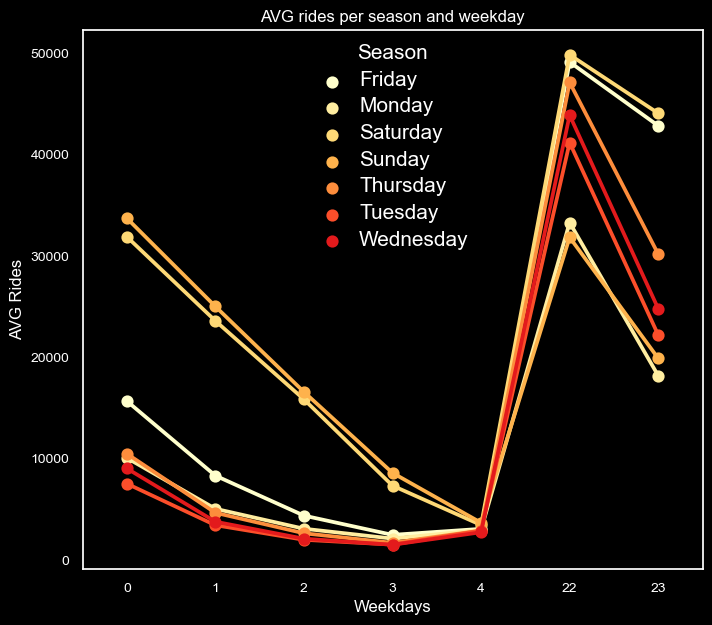

In [335]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have the necessary data loaded and processed
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
# Adjusting color settings
sns.set_theme(rc={'axes.facecolor': 'black', 'figure.facecolor': 'black', 'grid.color': 'black'})

# Data preprocessing and plotting
fig, ax = plt.subplots(figsize=(8, 7))
rides_count_7 = night.groupby(['weekday_start_at', 'start_hour']).size().reset_index(name='ride_count')
hour_color = ['#ffffcc', '#ffeda0', '#fed976', '#feb24c', '#fd8d3c', '#fc4e2a', '#e31a1c', '#b10026']

sns.pointplot(x= 'start_hour', y='ride_count', hue='weekday_start_at', data=rides_count_7, palette= hour_color)

# Customizing plot appearance
plt.xticks(fontsize=10, color='white')
plt.yticks(fontsize=10, color='white')
plt.title('AVG rides per season and weekday', color='white')
plt.xlabel('Weekdays', color='white')
plt.ylabel('AVG Rides', color='white')
plt.setp(ax.get_legend().get_texts(), fontsize='15', color='white')  # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='15', color='white')  # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title("Season")
plt.show()

# Plot: avg ride per whour and year

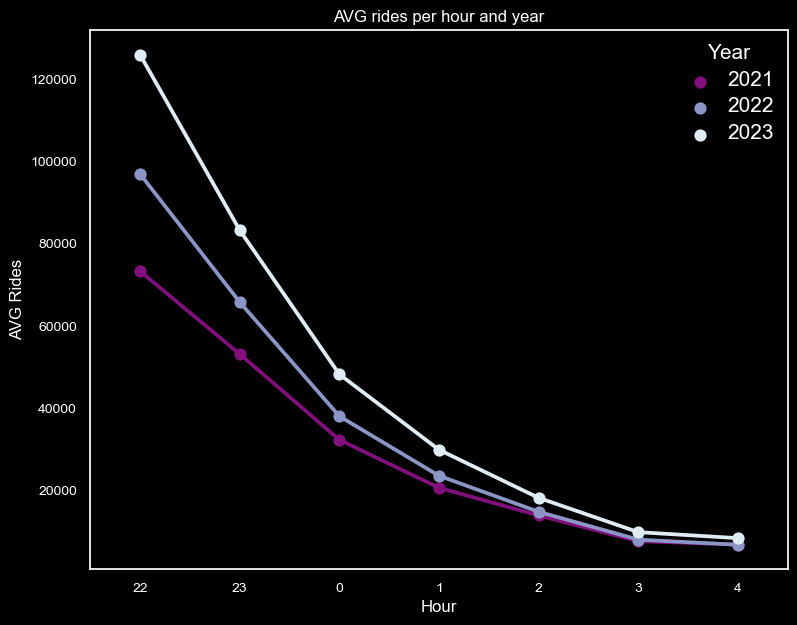

In [337]:
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.set_theme(rc={'axes.facecolor':'black', 'figure.facecolor':'black', 'grid.color': 'black' })
fig , ax = plt.subplots (figsize = (9,7))

gabi_r=['#c6dbef', '#084594']
order1=[22, 23, 0, 1, 2, 3, 4]
year_color=['#810f7c', '#8c96c6', '#e0ecf4']

rides_count_9 = night.groupby(['start_hour', 'year']).size().reset_index(name='ride_count')

sns.pointplot(x='start_hour', y='ride_count', hue='year',  errwidth=15, data=rides_count_9, order=order1, palette=year_color)
plt.xticks(fontsize=10, color='white')
plt.yticks(fontsize=10, color='white')
plt.title('AVG rides per hour and year', color='white')
plt.xlabel('Hour', color='white')
plt.ylabel('AVG Rides', color='white')


plt.setp(ax.get_legend().get_texts(), fontsize='15', color='white') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='15', color='white') # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title("Year")

# Checking trip_duration for all years

In [354]:
night['trip_duration'] = pd.to_timedelta(night['trip_duration'])

# Calculate trip duration in minutes
night['trip_duration_minutes'] = night['trip_duration'].dt.total_seconds() / 60

In [ ]:
night.shape

(785378, 31)

In [355]:
night.head(2)

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,...,started_at_evening,end_hour,ended_at_morning,ended_at_midday,ended_at_evening,night_trips_start,night_trips_end,weekday_ended_at,distance_km,trip_duration_minutes
0,5CB9DFCECF79AF84,classic,2021-01-01 00:08:33,2021-01-01 00:33:53,MAINE AVE & 9TH ST SW,0.0,ROSSLYN METRO / WILSON BLVD & FT MYER DR,0.0,38.880440,-77.025236,...,0,0,0,0,0,1,1,Friday,4.367593,25.333333
1,629E059504606547,electric,2021-01-01 00:13:43,2021-01-01 00:29:34,10TH & U ST NW,0.0,NaN,0.0,38.917193,-77.025894,...,0,0,0,0,0,1,1,Friday,4.787179,15.850000


# Plot: trip duration per year and day of the week

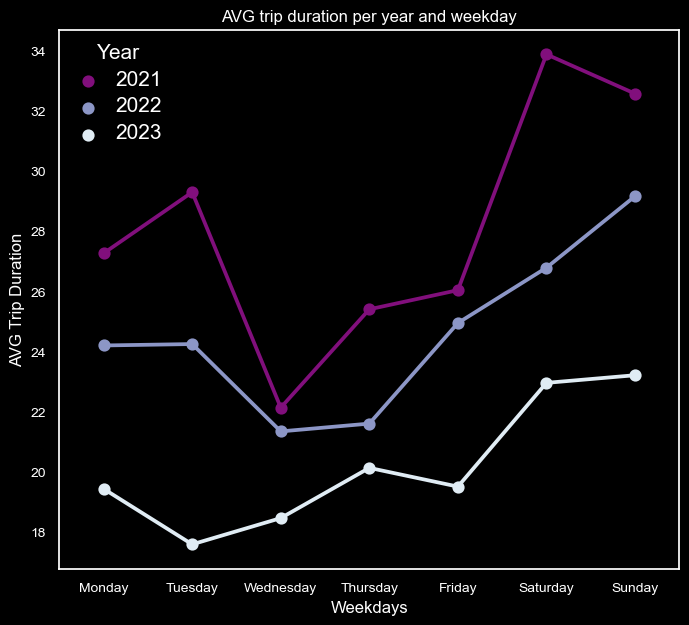

In [356]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have the necessary data loaded and processed
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
# Adjusting color settings
sns.set_theme(rc={'axes.facecolor': 'black', 'figure.facecolor': 'black', 'grid.color': 'black'})

# Data preprocessing and plotting
fig, ax = plt.subplots(figsize=(8, 7))

season_color = ['red', 'green', 'orange', 'white']

sns.pointplot(x='weekday_start_at', y='trip_duration_minutes', hue='year', data=night, errorbar= None, order=weekday_order, palette= year_color)

# Customizing plot appearance
plt.xticks(fontsize=10, color='white')
plt.yticks(fontsize=10, color='white')
plt.title('AVG trip duration per year and weekday', color='white')
plt.xlabel('Weekdays', color='white')
plt.ylabel('AVG Trip Duration', color='white')
plt.setp(ax.get_legend().get_texts(), fontsize='15', color='white')  # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='15', color='white')  # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title('Year')

plt.show()

# Plot: trip duration per year and season

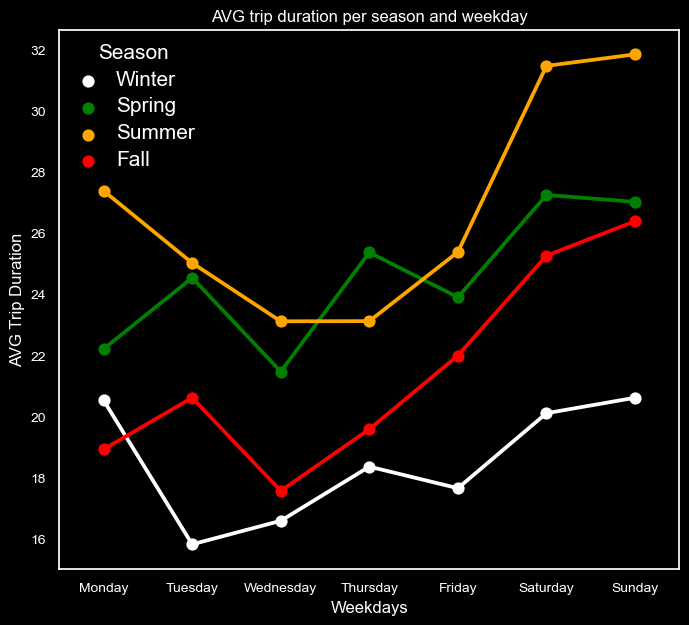

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have the necessary data loaded and processed
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
# Adjusting color settings
sns.set_theme(rc={'axes.facecolor': 'black', 'figure.facecolor': 'black', 'grid.color': 'black'})

# Data preprocessing and plotting
fig, ax = plt.subplots(figsize=(8, 7))

season_color = ['white', 'green', 'orange', 'red']

sns.pointplot(x='weekday_start_at', y='trip_duration_minutes', hue='season', data= night, errorbar= None, order=weekday_order, palette=season_color)

# Customizing plot appearance
plt.xticks(fontsize=10, color='white')
plt.yticks(fontsize=10, color='white')
plt.title('AVG trip duration per season and weekday', color='white')
plt.xlabel('Weekdays', color='white')
plt.ylabel('AVG Trip Duration', color='white')
plt.setp(ax.get_legend().get_texts(), fontsize='15', color='white')  # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='15', color='white')  # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title("Season")
plt.show()

In [ ]:
night.info()

<class 'pandas.core.frame.DataFrame'>
Index: 785378 entries, 0 to 887593
Data columns (total 31 columns):
 #   Column                 Non-Null Count   Dtype          
---  ------                 --------------   -----          
 0   ride_id                785378 non-null  object         
 1   rideable_type          785378 non-null  object         
 2   started_at             785378 non-null  datetime64[ns] 
 3   ended_at               785378 non-null  datetime64[ns] 
 4   start_station_name     704232 non-null  object         
 5   start_station_id       785377 non-null  float64        
 6   end_station_name       688359 non-null  object         
 7   end_station_id         785377 non-null  float64        
 8   start_lat              785377 non-null  float64        
 9   start_lng              785377 non-null  float64        
 10  end_lat                783359 non-null  float64        
 11  end_lng                783359 non-null  float64        
 12  member_casual          785378 non-n

# Plot: trip duration per user type and hour

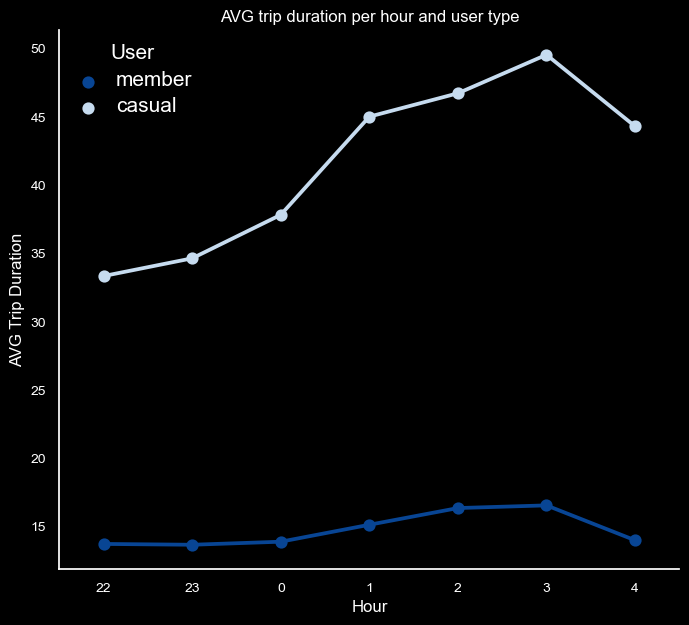

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have the necessary data loaded and processed
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
# Adjusting color settings
sns.set_theme(rc={'axes.facecolor': 'black', 'figure.facecolor': 'black', 'grid.color': 'black'})

mask_start_without_5 = (night['start_hour'] >= 22) | (night['start_hour'] < 5)

# Apply the mask to filter the DataFrame
night_5 = night[mask_start_without_5]
order1=[22, 23, 0, 1, 2, 3, 4]
# Data preprocessing and plotting
fig, ax = plt.subplots(figsize=(8, 7))

season_color = ['white', 'green', 'orange', 'red']

sns.pointplot(x='start_hour', y='trip_duration_minutes', hue='member_casual', data= night_5, errorbar= None, palette=gabi,  order=order1)

# Customizing plot appearance
plt.xticks(fontsize=10, color='white')
plt.yticks(fontsize=10, color='white')
plt.title('AVG trip duration per hour and user type', color='white')
plt.xlabel('Hour', color='white')
plt.ylabel('AVG Trip Duration', color='white')
plt.setp(ax.get_legend().get_texts(), fontsize='15', color='white')  # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='15', color='white')  # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title("User")
sns.despine(right=True, bottom=False)
plt.show()

# Plot: ride count per bike typer and day of the week

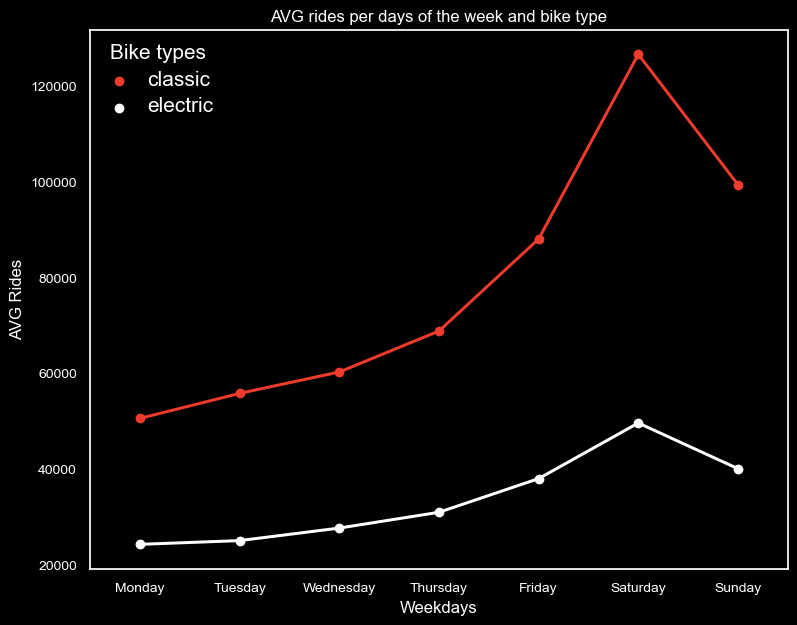

In [ ]:
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.set_theme(rc={'axes.facecolor':'black', 'figure.facecolor':'black', 'grid.color': 'black' })
fig , ax = plt.subplots (figsize = (9,7))

rides_count_10 = night.groupby(['weekday_start_at', 'rideable_type']).size().reset_index(name='ride_count')

sns.pointplot(x='weekday_start_at', y='ride_count', hue='rideable_type', scale=0.8, errwidth=9, order=weekday_order, data= rides_count_10, palette=gabi_white_purple)
plt.xticks(fontsize=10, color='white')
plt.yticks(fontsize=10, color='white')
plt.title('AVG rides per days of the week and bike type', color='white')
plt.xlabel('Weekdays', color='white')
plt.ylabel('AVG Rides', color='white')


plt.setp(ax.get_legend().get_texts(), fontsize='15', color='white') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='15', color='white') # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title("Bike types")

# Plot: ride count per bike type and hour

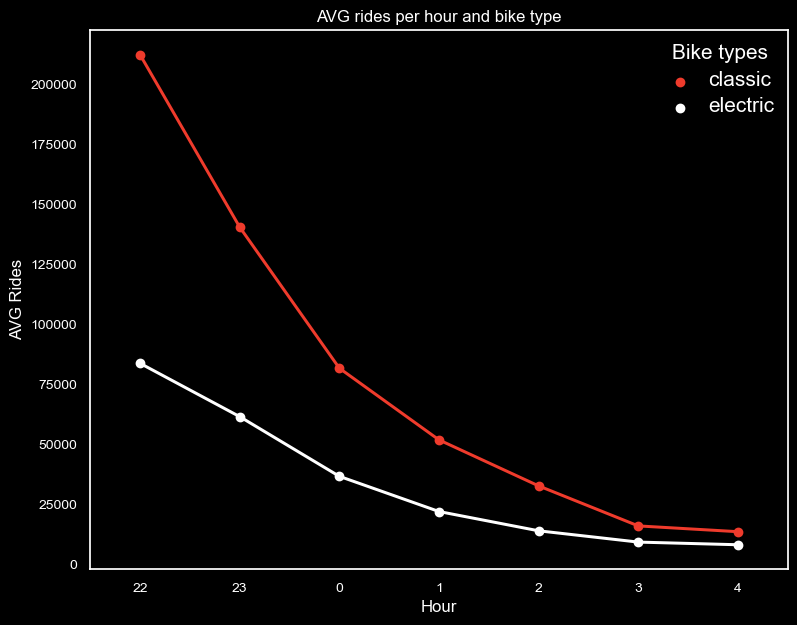

In [ ]:
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.set_theme(rc={'axes.facecolor':'black', 'figure.facecolor':'black', 'grid.color': 'black' })
fig , ax = plt.subplots (figsize = (9,7))

rides_count_14 = night.groupby(['start_hour', 'rideable_type']).size().reset_index(name='ride_count')

sns.pointplot(x='start_hour', y='ride_count', hue='rideable_type', scale=0.8, errwidth=9, data= rides_count_14, order=order1, palette=gabi_white_purple)
plt.xticks(fontsize=10, color='white')
plt.yticks(fontsize=10, color='white')
plt.title('AVG rides per hour and bike type', color='white')
plt.xlabel('Hour', color='white')
plt.ylabel('AVG Rides', color='white')


plt.setp(ax.get_legend().get_texts(), fontsize='15', color='white') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='15', color='white') # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title("Bike types")

# Plot: Ride count per day of the weekday an hour

In [ ]:
# Create a boolean mask for values between 0-5 or 22-24
mask_start_friday = (night['start_hour'] >= 22) #& (rides_per_weekday['year'] == 2021)
mask_start_saturday=(night['start_hour'] <= 5) #& (rides_per_weekday['year'] == 2021)

# Apply the mask to filter the DataFrame
filtered_start_22 = night[mask_start_friday]
filtered_start_5 = night[mask_start_saturday]

In [ ]:
rides_count_11 = filtered_start_22.groupby(['weekday_start_at', 'start_hour']).size().reset_index(name='ride_count')
rides_count_12 = filtered_start_5.groupby(['weekday_start_at', 'start_hour']).size().reset_index(name='ride_count')

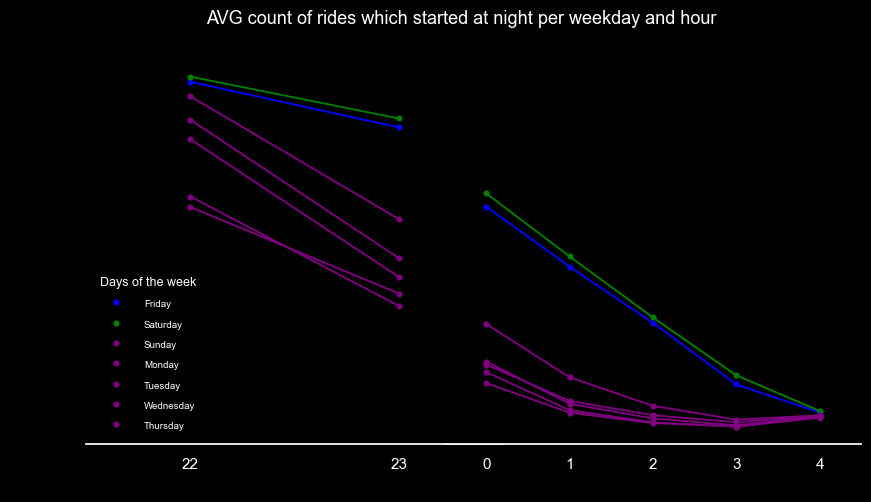

In [ ]:
gabi_friday=['blue', 'green', 'purple', 'purple', 'purple', 'purple', 'purple']
gabi_saturday=['green', 'purple', 'purple', 'purple', 'purple', 'purple', 'blue']
day_orded=['Friday', 'Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday']
day_orded_1=['Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']

fig, axs= plt.subplots(nrows = 1, ncols= 2, sharey = True, figsize = (10,5))
plt.subplots_adjust(wspace=-0.14)  # Set the width space between subplots to 0
plt.suptitle('AVG count of rides which started at night per weekday and hour', fontsize=13, color='white')
sns.pointplot(x='start_hour', y='ride_count', hue='weekday_start_at', hue_order=day_orded, scale=0.5, errorbar=None, data=rides_count_11, palette=gabi_friday, ax=axs[0])
sns.pointplot(x='start_hour', y='ride_count', hue='weekday_start_at', hue_order=day_orded_1, scale=0.5, errorbar=None, data=rides_count_12, palette=gabi_friday, ax=axs[1])
axs[0].set_xlabel('Quality label', fontdict={'size': 12, 'weight': 'bold', 'color': 'black'})
axs[0].set_ylabel('AVG rides', fontdict={'size': 12, 'weight': 'bold', 'color': 'black'})
axs[1].set_xlabel('Quality label', fontdict={'size': 12, 'weight': 'bold', 'color': 'black'})
axs[1].set_ylabel('Fixed acidity', fontdict={'size': 12, 'weight': 'bold', 'color': 'black'})
axs[0].tick_params(axis='x', colors='white')
axs[0].tick_params(axis='y', colors='black')
axs[1].tick_params(axis='x', colors='white')

sns.despine(ax=axs[1], left=True, top=True)
sns.despine(ax=axs[0], left=True, top=True)
axs[1].get_legend().remove()
axs[0].legend(bbox_to_anchor=(0, 0), loc='lower left')
plt.setp(axs[0].get_legend().get_texts(), fontsize='7', color='white') # for legend text
plt.setp(axs[0].get_legend().get_title(), fontsize='9', color='white') # for legend title
axs[0].get_legend().set_frame_on(False)
axs[0].get_legend().set_title("Days of the week")

#axs[1].tick_params(axis='y', colors='white')

# Filtering with only null End station names, latitude and longtitude

In [ ]:
filtered_null = night[night['end_station_name'].isnull() & night['end_lat'].isnull() & night['end_lng'].isnull()]


In [344]:
filtered_null['rideable_type'].value_counts()

rideable_type
classic    2018
Name: count, dtype: int64

In [ ]:
filtered_null.head(2)

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,...,started_at_evening,end_hour,ended_at_morning,ended_at_midday,ended_at_evening,night_trips_start,night_trips_end,weekday_ended_at,distance_km,trip_duration_minutes
600,2F5D34B421195385,classic,2021-01-04 00:56:11,2021-01-05 01:56:06,BENNING RD & EAST CAPITOL ST NE / BENNING RD M...,0.0,NaN,0.0,38.889935,-76.93723,...,0,1,0,0,0,1,1,Tuesday,NaN,1499.916667
863,A5BADE17BB771CCE,classic,2021-01-05 22:48:32,2021-01-05 22:57:10,1ST ST & POTOMAC AVE SE,0.0,NaN,0.0,38.871841,-77.00591,...,0,22,0,0,0,1,1,Tuesday,NaN,8.633333


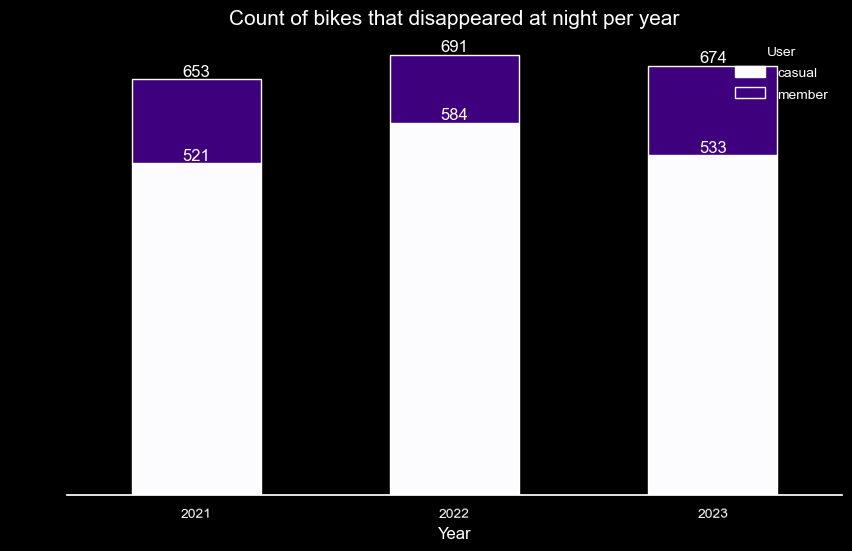

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Group by weekday_start_at and member_casual, and count the number of rides
grouped_df = filtered_null.groupby(['year', 'member_casual']).size().unstack(fill_value=0)

# Plot stacked bar plot
ax=grouped_df.plot(kind='bar', stacked=True, figsize=(10, 6), cmap='Purples')



plt.title('Count of bikes that disappeared at night per year', fontsize=15, color='white')
plt.xticks(fontsize=10, color='white', rotation=0.9)
plt.yticks(fontsize=10, color='black')
plt.xlabel('Year', color='white')
plt.ylabel('Count', color='black')
plt.setp(ax.get_legend().get_texts(), fontsize='10', color='white') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='10', color='white') # for legend title
ax.get_legend().set_frame_on(False)
ax.get_legend().set_title("User")



# Iterate over each container and add labels to each category
for container in ax.containers:
    ax.bar_label(container, color='white')
sns.despine(left=True)

In [ ]:
filtered_null.shape

(2018, 31)

In [ ]:
filtered_null_groupby = filtered_null.groupby(['weekday_start_at', 'year']).size().reset_index(name='ride_count')

In [ ]:
# they are all causal and docked

In [ ]:
sorted_df = filtered_null_groupby.sort_values(by='ride_count', ascending=False)

In [ ]:
sorted_df.head(5)

,weekday_start_at,year,ride_count
8,Saturday,2023,182
6,Saturday,2021,180
7,Saturday,2022,177
10,Sunday,2022,171
9,Sunday,2021,158


## Create a top five of the stattion from which the missing bikes were taken

In [ ]:
filtered_null_groupby_station_name = filtered_null.groupby(['start_station_name', 'start_lat', 'start_lng']).size().reset_index(name='ride_count')

In [ ]:
sorted_null_start_station=filtered_null_groupby_station_name.sort_values(by='ride_count', ascending=False)

In [ ]:
top_five=sorted_null_start_station.head(5)

In [ ]:
top_five


,start_station_name,start_lat,start_lng,ride_count
40,13TH & U ST NW,38.916936,-77.029631,27
377,MAINE AVE & 7TH ST SW,38.878694,-77.023054,20
91,18TH & M ST NW,38.905067,-77.041779,20
54,14TH & Q ST NW,38.910674,-77.031880,20
500,THOMAS CIRCLE,38.905900,-77.032500,19


## Check which stations are most popular in general

In [ ]:
rides_per_start_station = night.groupby(['start_station_name']).size().reset_index(name='ride_count')

In [ ]:
sorted_start_stations = rides_per_start_station.sort_values(by='ride_count', ascending=False)

In [349]:
sorted_start_stations.head(5)

,start_station_name,ride_count
54,14TH & RHODE ISLAND AVE NW,11136
101,18TH ST & WYOMING AVE NW,10759
53,14TH & R ST NW,9633
70,15TH & P ST NW,8360
230,ADAMS MILL & COLUMBIA RD NW,7905


In [350]:
#start_ride_23_friday_2023 = night[(night['year'] == 2023) & (night['weekday_start_at'] == 'Friday') & (night['start_hour'] == 22)]

In [351]:
# rides_per_start_station_friday_23= start_ride_23_friday_2023.groupby(['start_station_name']).size().reset_index(name='ride_count')

In [352]:
#rides_per_start_station_friday_23.sort_values(by='ride_count', ascending=False).head(10)

In [ ]:
# Friday 2023 at 23h start
# 14TH & R ST NW	290
# 18TH ST & WYOMING AVE NW	261
# ADAMS MILL & COLUMBIA RD NW	223
# 14TH ST & RHODE ISLAND AVE NW	221
# 14TH & V ST NW	204
# NEW HAMPSHIRE AVE & T ST NW	193
# EASTERN MARKET METRO / PENNSYLVANIA AVE & 8TH ...	191
# MAINE AVE & 7TH ST SW	185
# 11TH & KENYON ST NW	171
# 8TH & O ST NW	166

In [ ]:
# Saturdays 2023 at 23h start
# 14TH & R ST NW	270
# 18TH ST & WYOMING AVE NW	265
# ADAMS MILL & COLUMBIA RD NW	243
# MAINE AVE & 7TH ST SW	193
# 8TH & O ST NW	193
# 11TH & KENYON ST NW	183
# 14TH & V ST NW	182
# 14TH ST & RHODE ISLAND AVE NW	173
# COLUMBUS CIRCLE / UNION STATION	155
# EASTERN MARKET METRO / PENNSYLVANIA AVE & 8TH ...	152

## Mapping the top 5 stations from which the bikes disappear

In [ ]:
import folium

# Create a Folium map centered around Washington, D.C.
map_dc = folium.Map(location=[38.894890, -77.019924], zoom_start=13)

# Define the bounding box for the image layer
bounds = [[38.947227, -77.137015], [38.823466, -76.912963]]

# Add the image layer to the map
image_url = 'blood washington.png'  # Replace this with the URL of your image
folium.raster_layers.ImageOverlay(
    image_url,
    bounds=bounds,
    opacity=0.5,  # Adjust the opacity as needed
).add_to(map_dc)

# Add a custom tile layer with a night-themed map (e.g., 'Mapbox Dark')
folium.TileLayer('cartodb dark_matter').add_to(map_dc)

top_five_series= [
    {'start_station_name': '13TH & U ST NW', 'start_lat':38.916936, 'start_lng':-77.029631},
    {'start_station_name': 'MAINE AVE & 7TH ST SW', 'start_lat': 38.878694, 'start_lng': -77.023054},
    {'start_station_name': '18TH & M ST NW', 'start_lat': 38.905067, 'start_lng': -77.041779},
    {'start_station_name': '14TH & Q ST NW', 'start_lat': 38.910674, 'start_lng': -77.031880},
    {'start_station_name': 'THOMAS CIRCLE', 'start_lat': 38.905900, 'start_lng': -77.032500}
]

# Add markers for each station using custom images
for station in top_five_series:
    # Replace 'path_to_custom_image.png' with the path to your custom image file
    icon_image = folium.features.CustomIcon('no location.png', icon_size=(35, 35))
    
    # Add markers with custom images
    folium.Marker(
        location=[station['start_lat'], station['start_lng']],
        popup=station['start_station_name'],
        icon=icon_image
    ).add_to(map_dc)




    # Add three more markers with custom PNG icons
# Replace 'path_to_custom_icon.png' with the paths to your custom PNG icon files
folium.Marker(
    location=[38.897846, -77.036541],
    popup="Monument",
    icon=folium.CustomIcon('white house.png', icon_size=(50, 50))
).add_to(map_dc)

folium.Marker(
    location=[38.889646, -77.035242],
    popup="Monument",
    icon=folium.CustomIcon('kisspng-angle-washington-monument-5b2d317f7aebe2.5669693615296884475035.png', icon_size=(100, 100))
).add_to(map_dc)

folium.Marker(
    location=[38.889330, -77.009149],
    popup="United Stated Capitol",
    icon=folium.CustomIcon('kisspng-united-states-capitol-dome-washington-monument-lan-capitol-5b51b9f80b7435.8643975715320826800469.png', icon_size=(110, 110))
).add_to(map_dc)

folium.Marker(
    location=[38.901651, -77.028672],
    popup="deko",
    icon=folium.CustomIcon('flag.png', icon_size=(60, 60))
).add_to(map_dc)

# Display the map
map_dc
map_dc.save("my_map.html")


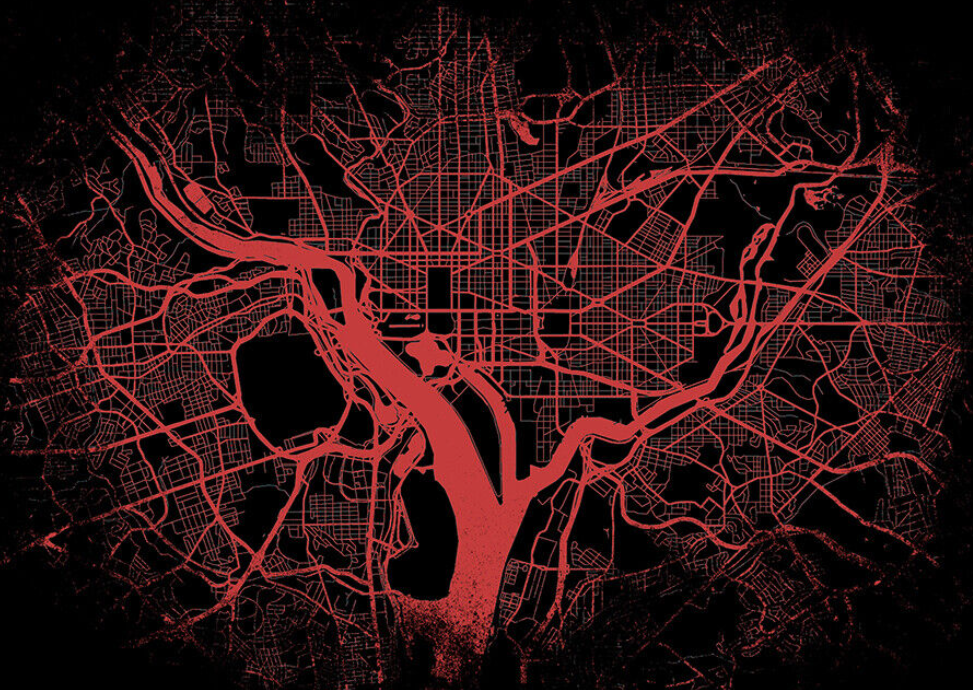
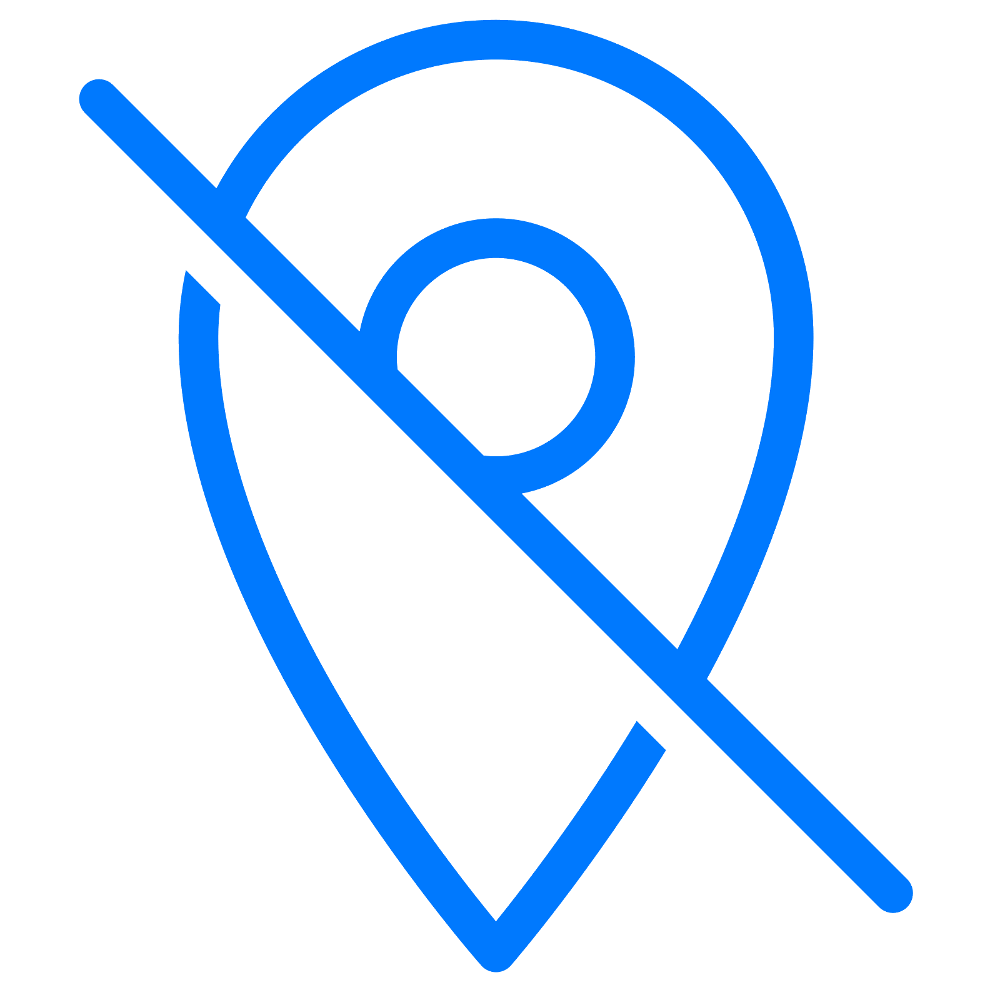
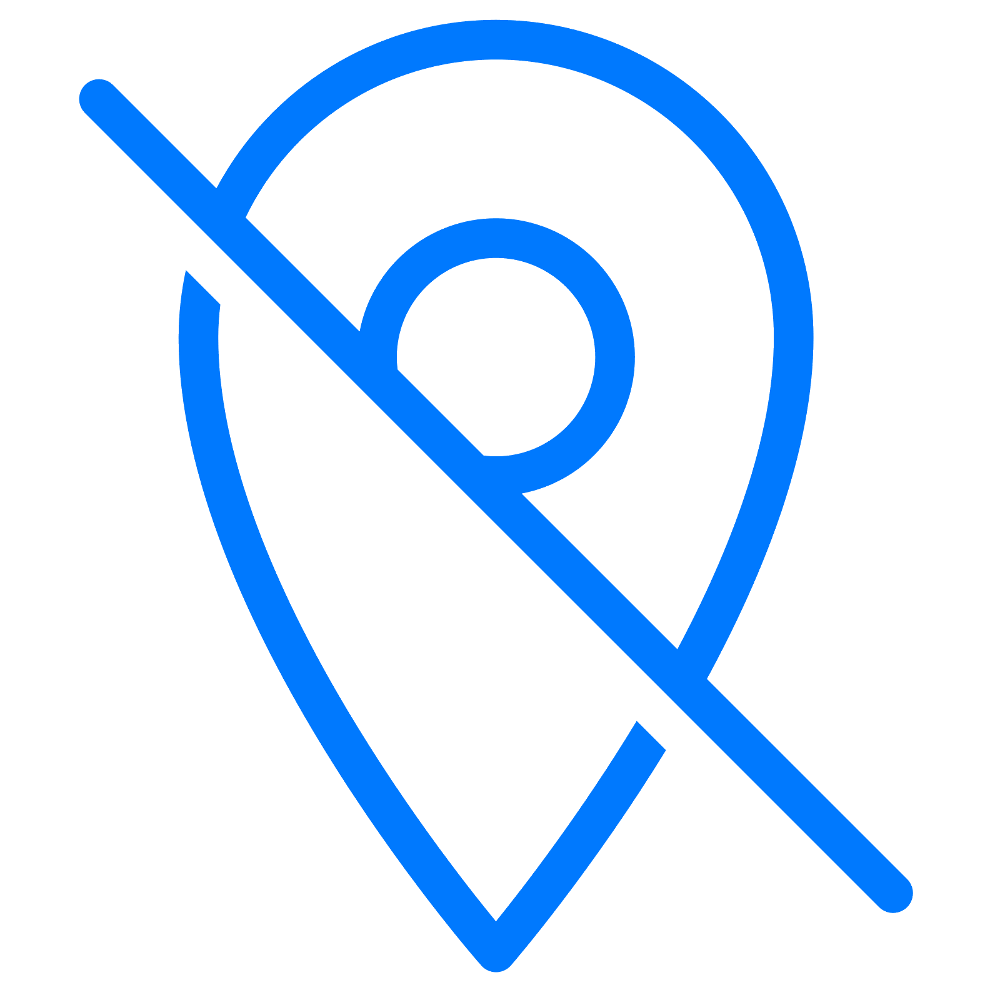
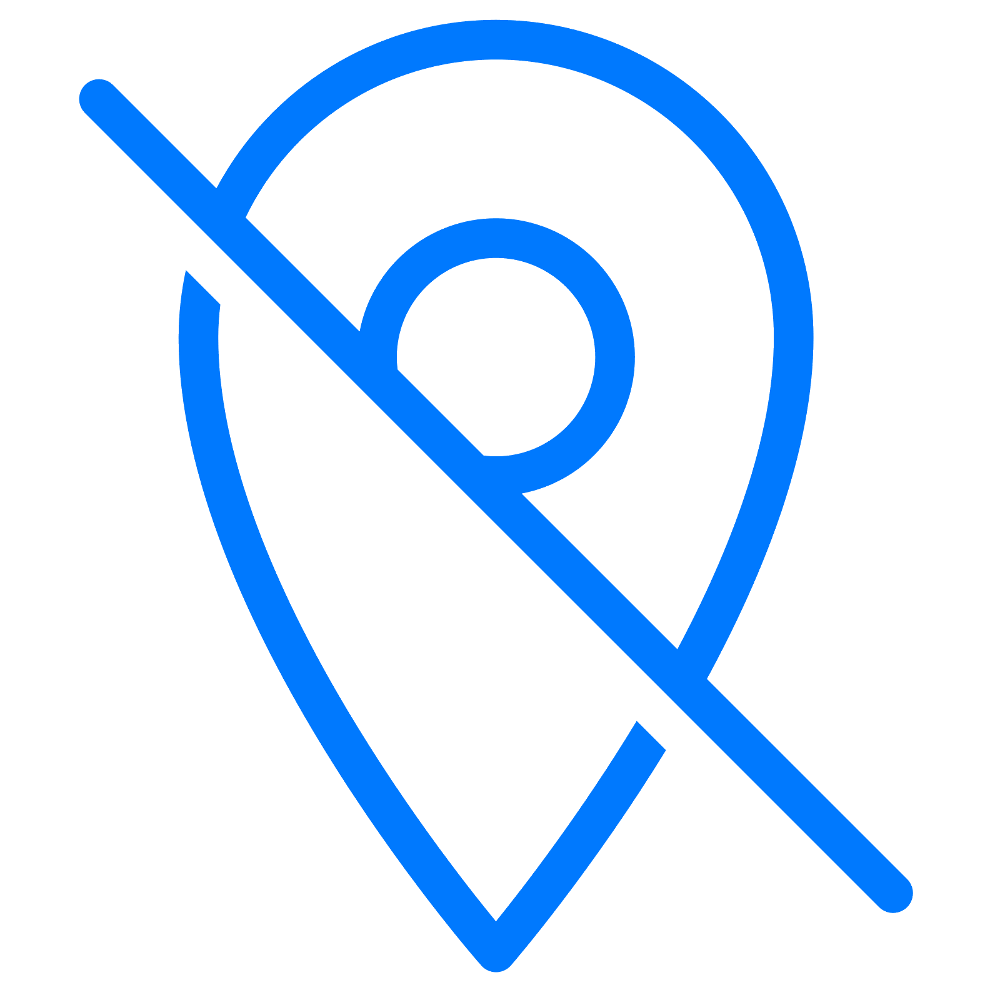
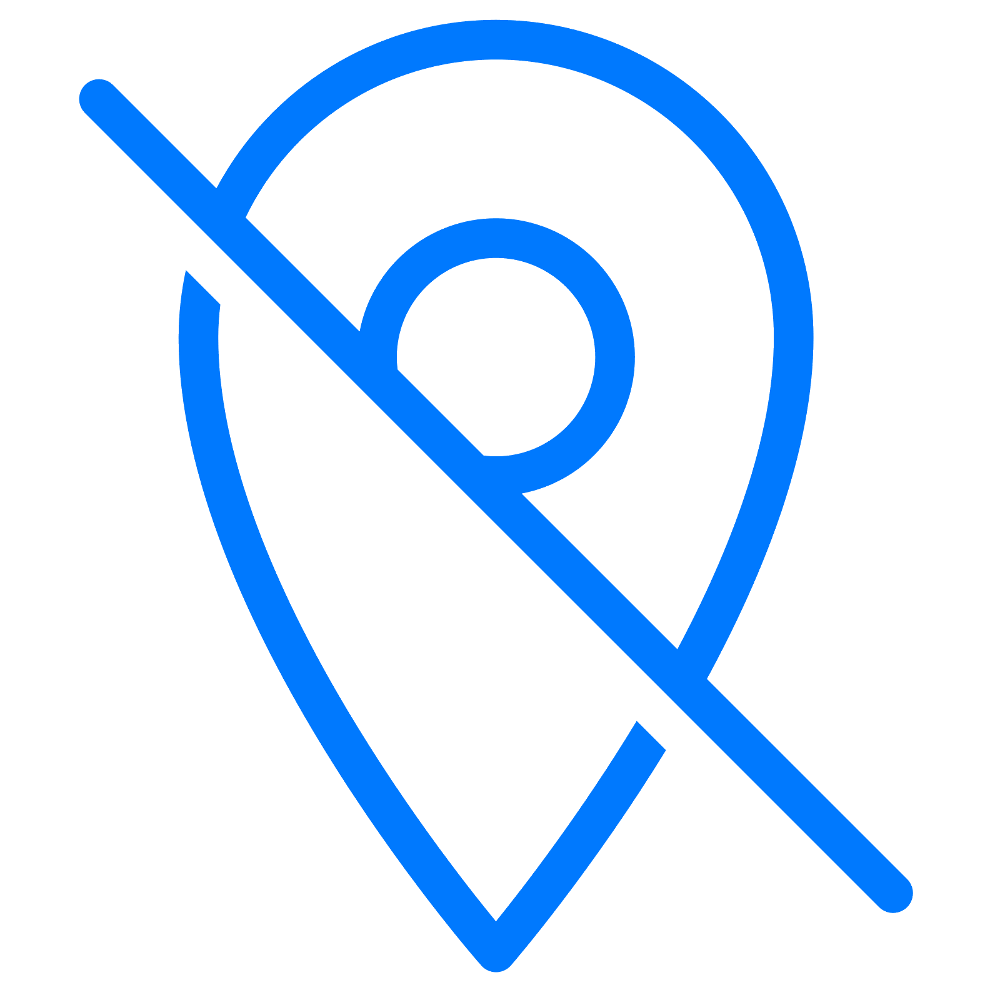
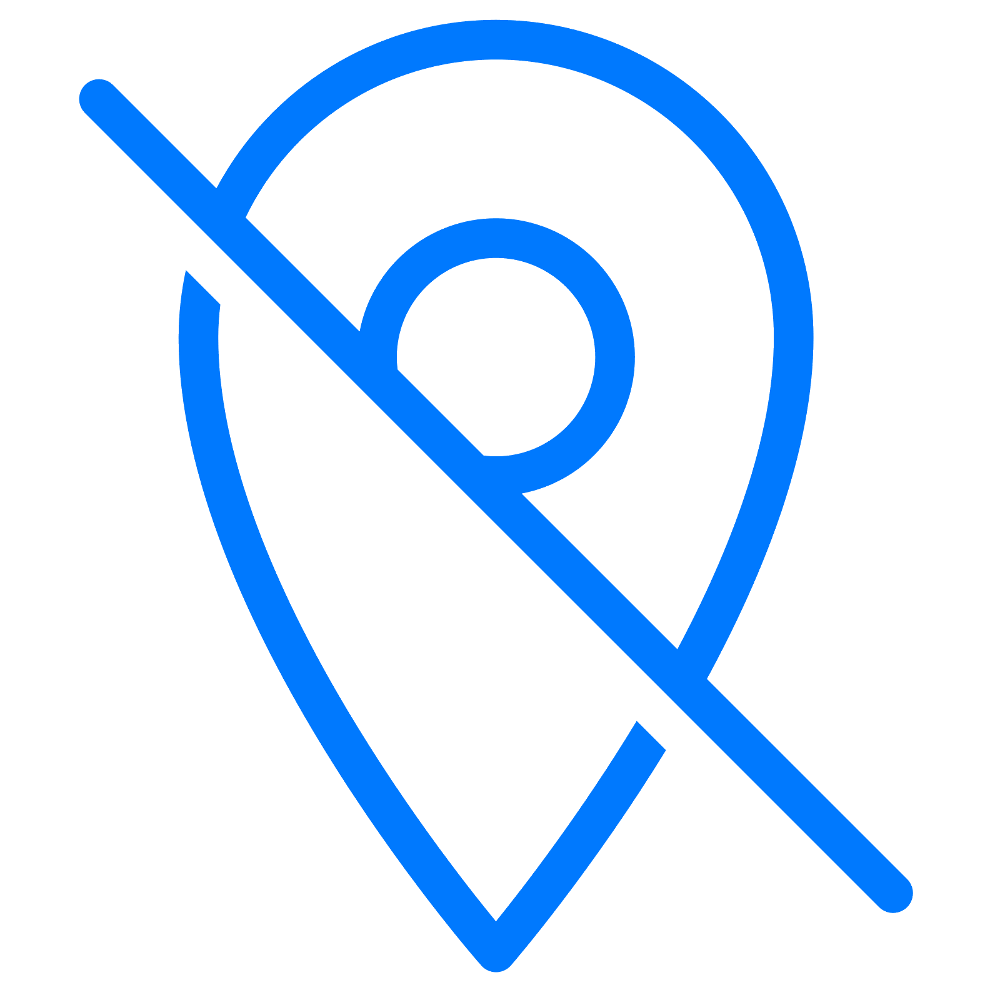
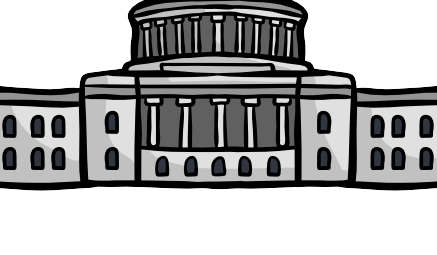
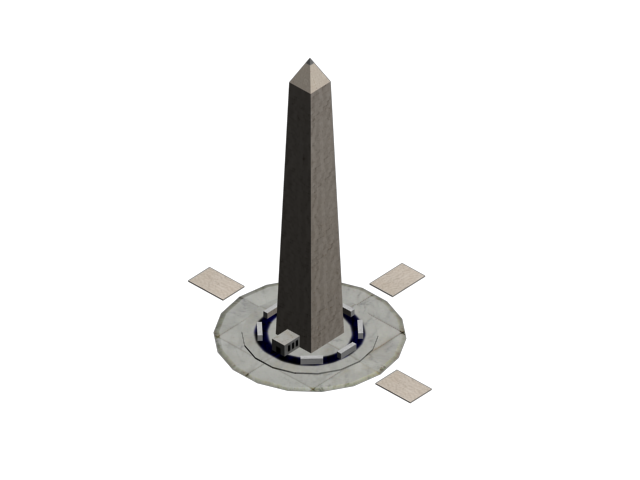
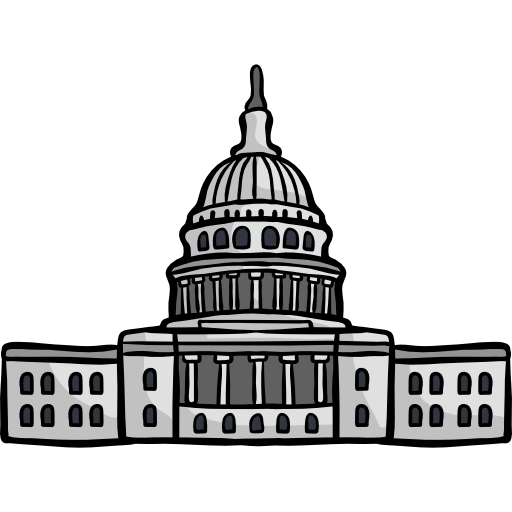
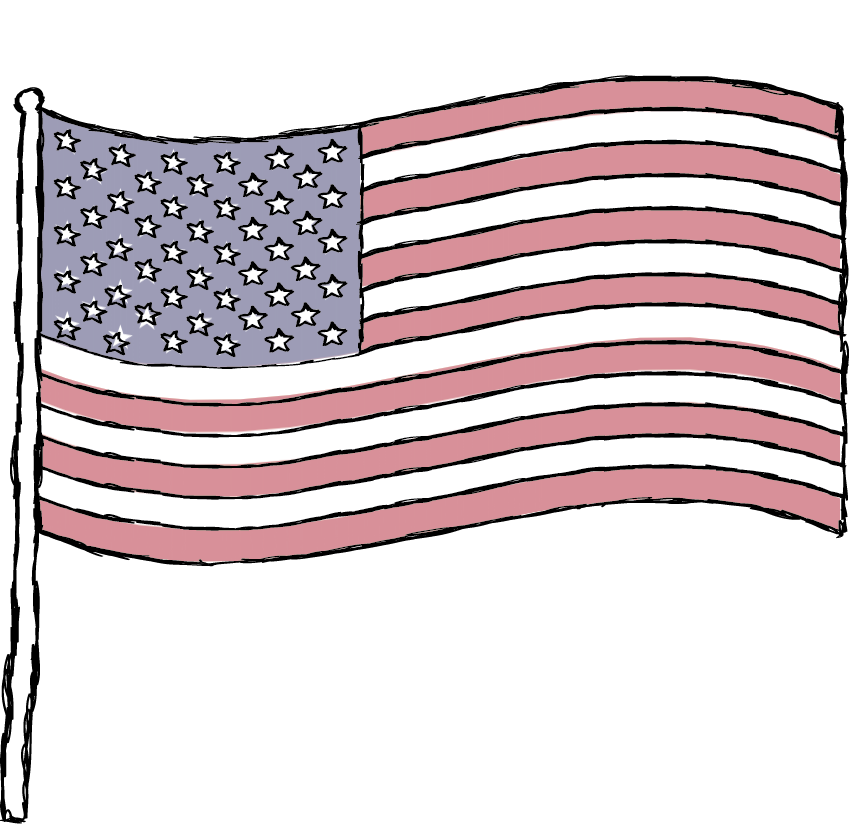

In [ ]:
map_dc

### remove bike from bike type column

In [ ]:
night['rideable_type']=night['rideable_type'].replace('_bike', '')

In [ ]:
night.info()

<class 'pandas.core.frame.DataFrame'>
Index: 785378 entries, 0 to 887593
Data columns (total 31 columns):
 #   Column                 Non-Null Count   Dtype          
---  ------                 --------------   -----          
 0   ride_id                785378 non-null  object         
 1   rideable_type          785378 non-null  object         
 2   started_at             785378 non-null  datetime64[ns] 
 3   ended_at               785378 non-null  datetime64[ns] 
 4   start_station_name     704232 non-null  object         
 5   start_station_id       785377 non-null  float64        
 6   end_station_name       688359 non-null  object         
 7   end_station_id         785377 non-null  float64        
 8   start_lat              785377 non-null  float64        
 9   start_lng              785377 non-null  float64        
 10  end_lat                783359 non-null  float64        
 11  end_lng                783359 non-null  float64        
 12  member_casual          785378 non-n

## Preparing the data to use it for a heatmap

### removing missing values from thwe columns with start geo coordinates

In [ ]:
df__no_null_start = night.dropna(subset=['start_lat']).reset_index(drop=True)
df__no_null_start_1 = df__no_null_start.dropna(subset=['start_lng']).reset_index(drop=True)


In [ ]:
df__no_null_start_1.info(3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 785377 entries, 0 to 785376
Data columns (total 31 columns):
 #   Column                 Non-Null Count   Dtype          
---  ------                 --------------   -----          
 0   ride_id                785377 non-null  object         
 1   rideable_type          785377 non-null  object         
 2   started_at             785377 non-null  datetime64[ns] 
 3   ended_at               785377 non-null  datetime64[ns] 
 4   start_station_name     704231 non-null  object         
 5   start_station_id       785377 non-null  float64        
 6   end_station_name       688358 non-null  object         
 7   end_station_id         785377 non-null  float64        
 8   start_lat              785377 non-null  float64        
 9   start_lng              785377 non-null  float64        
 10  end_lat                783359 non-null  float64        
 11  end_lng                783359 non-null  float64        
 12  member_casual          785377 

# Checking most popular stations at 4 during a workday (monday)

# 2023

In [ ]:
df__no_null_4_monday_2023=df__no_null_start_1[(df__no_null_start_1['start_hour'] == 4) & (df__no_null_start_1['weekday_start_at'] == 'Monday') & (df__no_null_start_1['year'] == 2023)]

In [ ]:
grouped_df__no_null_4_monday_2023= df__no_null_4_monday_2023.groupby(['start_station_name']).size().reset_index(name='ride_count')

In [ ]:
top_ten_4_monday_2023=grouped_df__no_null_4_monday_2023.sort_values(by='ride_count', ascending=False).head(10)

In [ ]:
top_ten_4_monday_2023.to_csv('top_ten_4_monday_2023.csv', index=False)


In [ ]:
heatmap_4_monday_2023= df__no_null_4_monday_2023[['start_lat', 'start_lng']]

In [ ]:
import folium
from folium.plugins import HeatMap

# Sample data
data = heatmap_4_monday_2023
gradient0={0.3:'white', 0.6:'blue', 1:'green'}

# Create a base map
map_center = [38.92, -77.03]  # Centered around the approximate midpoint of the data
m_2023 = folium.Map(location=map_center, zoom_start=12)

# Add a custom tile layer with a night-themed map (e.g., 'Mapbox Dark')
folium.TileLayer('cartodb dark_matter').add_to(m_2023)

# Add heatmap layer
HeatMap(data, gradient=gradient0, max_opacity=0.7, min_opacity=0.4).add_to(m_2023)
m_2023.save('m_2023.html')

In [ ]:
m_2023

# 2022

In [ ]:
df__no_null_4_monday_2022=df__no_null_start_1[(df__no_null_start_1['start_hour'] == 4) & (df__no_null_start_1['weekday_start_at'] == 'Monday') & (df__no_null_start_1['year'] == 2022)]

In [ ]:
grouped_df__no_null_4_monday_2022= df__no_null_4_monday_2022.groupby(['start_station_name']).size().reset_index(name='ride_count')

In [ ]:
top_ten_4_monday_2022= grouped_df__no_null_4_monday_2022.sort_values(by='ride_count', ascending=False).head(10)

In [ ]:
top_ten_4_monday_2022
top_ten_4_monday_2022.to_csv('top_ten_4_monday_2022.csv', index=False)

In [ ]:
heatmap_4_monday_2022= df__no_null_4_monday_2022[['start_lat', 'start_lng']]

In [ ]:
import folium
from folium.plugins import HeatMap

# Sample data
data = heatmap_4_monday_2022
# Create a base map
map_center = [38.92, -77.03]  # Centered around the approximate midpoint of the data
m_2022 = folium.Map(location=map_center, zoom_start=12)

# Add a custom tile layer with a night-themed map (e.g., 'Mapbox Dark')
folium.TileLayer('cartodb dark_matter').add_to(m_2022)

# Add heatmap layer
HeatMap(data, max_opacity=0.7, min_opacity=0.4, gradient=gradient0).add_to(m_2022)
m_2022.save('m_2022.html')
m_2022

# 2021

In [ ]:
df__no_null_4_monday_2021=df__no_null_start_1[(df__no_null_start_1['start_hour'] == 4) & (df__no_null_start_1['weekday_start_at'] == 'Monday') & (df__no_null_start_1['year'] == 2021)]

In [ ]:
grouped_df__no_null_4_monday_2021= df__no_null_4_monday_2021.groupby(['start_station_name']).size().reset_index(name='ride_count')

In [ ]:
top_ten_4_monday_2021= grouped_df__no_null_4_monday_2021.sort_values(by='ride_count', ascending=False).head(10)

In [ ]:
top_ten_4_monday_2021
top_ten_4_monday_2021.to_csv('top_ten_4_monday_2021.csv', index=False)

In [ ]:
heatmap_4_monday_2021= df__no_null_4_monday_2021[['start_lat', 'start_lng']]

In [ ]:
import folium
from folium.plugins import HeatMap

# Sample data
data = heatmap_4_monday_2021
# Create a base map
map_center = [38.92, -77.03]  # Centered around the approximate midpoint of the data
m_2021 = folium.Map(location=map_center, zoom_start=12)


# Add a custom tile layer with a night-themed map (e.g., 'Mapbox Dark')
folium.TileLayer('cartodb dark_matter').add_to(m_2021)

# Add heatmap layer
HeatMap(data, gradient=gradient0, min_opacity=0.4, max_opacity=0.7).add_to(m_2021)
m_2021.save('m_2021.html')
m_2021

# Checking most popular stations at 22 during a workday (Saturday)

# 2023

In [ ]:
df__no_null_22_saturday_2023=df__no_null_start_1[(df__no_null_start_1['start_hour'] == 22) & (df__no_null_start_1['weekday_start_at'] == 'Saturday') & (df__no_null_start_1['year'] == 2023)]

In [ ]:
grouped_df__no_null_22_saturday_2023= df__no_null_22_saturday_2023.groupby(['start_station_name']).size().reset_index(name='ride_count')

In [ ]:
top_ten_22_saturday_2023= grouped_df__no_null_22_saturday_2023.sort_values(by='ride_count', ascending=False).head(10)

In [ ]:
top_ten_22_saturday_2023.to_csv('top_ten_22_saturday_2023.csv', index=False)

In [ ]:
heatmap_22_saturday_2023= df__no_null_22_saturday_2023[['start_lat', 'start_lng']]

In [ ]:
import folium
from folium.plugins import HeatMap

# Sample data
data = heatmap_22_saturday_2023

gradient1={0.3:'purple', 0.6:'white', 1:'red'}
# Create a base map
map_center = [38.92, -77.03]  # Centered around the approximate midpoint of the data
m_saturday_2023 = folium.Map(location=map_center, zoom_start=12)


# Add a custom tile layer with a night-themed map (e.g., 'Mapbox Dark')
folium.TileLayer('cartodb dark_matter').add_to(m_saturday_2023)

# Add heatmap layer
HeatMap(data, gradient=gradient1, max_opsity=0.8, min_opacity=0.4).add_to(m_saturday_2023)
m_saturday_2023.save('m_saturday_2023.html')
m_saturday_2023


# 2022

In [ ]:
df__no_null_22_saturday_2022=df__no_null_start_1[(df__no_null_start_1['start_hour'] == 22) & (df__no_null_start_1['weekday_start_at'] == 'Saturday') & (df__no_null_start_1['year'] == 2022)]

In [ ]:
grouped_df__no_null_22_saturday_2022= df__no_null_22_saturday_2022.groupby(['start_station_name']).size().reset_index(name='ride_count')

In [ ]:
top_ten_22_saturday_2022= grouped_df__no_null_22_saturday_2022.sort_values(by='ride_count', ascending=False).head(10)

In [ ]:
top_ten_22_saturday_2022.to_csv('top_ten_22_saturday_2022.csv', index=False)

In [ ]:
heatmap_22_saturday_2022= df__no_null_22_saturday_2022[['start_lat', 'start_lng']]

In [ ]:
import folium
from folium.plugins import HeatMap

# Sample data
data = heatmap_22_saturday_2022

gradient1={0.3:'purple', 0.6:'white', 1:'red'}
# Create a base map
map_center = [38.92, -77.03]  # Centered around the approximate midpoint of the data
m_saturday_2022 = folium.Map(location=map_center, zoom_start=12)


# Add a custom tile layer with a night-themed map (e.g., 'Mapbox Dark')
folium.TileLayer('cartodb dark_matter').add_to(m_saturday_2022)

# Add heatmap layer
HeatMap(data, gradient=gradient1, max_opsity=0.8, min_opacity=0.4).add_to(m_saturday_2022)
m_saturday_2022.save('m_saturday_2022.html')
m_saturday_2022

# 2021

In [ ]:
df__no_null_22_saturday_2021=df__no_null_start_1[(df__no_null_start_1['start_hour'] == 22) & (df__no_null_start_1['weekday_start_at'] == 'Saturday') & (df__no_null_start_1['year'] == 2021)]


In [ ]:
grouped_df__no_null_22_saturday_2021= df__no_null_22_saturday_2021.groupby(['start_station_name']).size().reset_index(name='ride_count')

In [ ]:
top_ten_22_saturday_2021= grouped_df__no_null_22_saturday_2021.sort_values(by='ride_count', ascending=False).head(10)

In [ ]:
top_ten_22_saturday_2021.to_csv('top_ten_22_saturday_2021.csv', index=False)

In [ ]:
heatmap_22_saturday_2021= df__no_null_22_saturday_2021[['start_lat', 'start_lng']]

In [ ]:
import folium
from folium.plugins import HeatMap

# Sample data
data = heatmap_22_saturday_2021

gradient1={0.3:'purple', 0.6:'white', 1:'red'}
# Create a base map
map_center = [38.92, -77.03]  # Centered around the approximate midpoint of the data
m_saturday_2021 = folium.Map(location=map_center, zoom_start=12)


# Add a custom tile layer with a night-themed map (e.g., 'Mapbox Dark')
folium.TileLayer('cartodb dark_matter').add_to(m_saturday_2021)

# Add heatmap layer
HeatMap(data, gradient=gradient1, max_opsity=0.8, min_opacity=0.4).add_to(m_saturday_2021)
m_saturday_2021.save('m_saturday_2021.html')
m_saturday_2021

# Creating moving Heatmap per hour 

# Summer

In [ ]:

# Ensure you're handing it floats
night['start_lat'] = night['start_lat'].astype(float)
night['start_lng'] = night['start_lng'].astype(float)

In [ ]:
night_summer=night[night['season']=='Summer']

In [ ]:
night_summer['season'].value_counts()

season
Summer    276739
Name: count, dtype: int64

In [ ]:
from folium import plugins

map_hooray = folium.Map(location=[38.92, -77.03],
                    zoom_start = 13) 


heat_df = night_summer[['start_lat', 'start_lng']]

In [ ]:
# Create weight column, using date
heat_df['Weight'] = night_summer['start_hour'].astype(float)

C:\Users\gabb_\AppData\Local\Temp\ipykernel_36184\1075202955.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  heat_df['Weight'] = night_summer['start_hour'].astype(float)


In [ ]:
heat_df.head(2)

,start_lat,start_lng,Weight
54249,38.908640,-77.022770,0.0
54250,38.892441,-77.048947,0.0


In [ ]:
heat_df = heat_df.dropna(axis=0, subset=['start_lat','start_lng', 'Weight'])
time_window=[22, 23, 0, 1, 2, 3, 4, 5]
# List comprehension to make out list of lists
heat_data = [[[row['start_lat'],row['start_lng']] for index, row in heat_df[heat_df['Weight'] == i].iterrows()] for i in time_window]

# Plot it on the map
hm = plugins.HeatMapWithTime(heat_data,index=time_window, auto_play=True, min_opacity= 0.2, max_opacity= 0.6, gradient= {0.3:'yellow', 0.6:'brown', 1:'red'})
hm.add_to(map_hooray)
# Add a custom tile layer with a night-themed map (e.g., 'Mapbox Dark')
folium.TileLayer('cartodb dark_matter').add_to(map_hooray)
# Display the map

map_hooray.save('map_hooray.html')
map_hooray

# Winter

In [ ]:
night_winter=night[night['season']=='Winter']

In [ ]:
from folium import plugins

map_hooray_winter = folium.Map(location=[38.92, -77.03],
                    zoom_start = 13) 


heat_df_winter = night_winter[['start_lat', 'start_lng']]

In [ ]:
# Create weight column, using date
heat_df_winter['Weight'] = night_winter['start_hour'].astype(float)

C:\Users\gabb_\AppData\Local\Temp\ipykernel_36184\1937553746.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  heat_df_winter['Weight'] = night_winter['start_hour'].astype(float)


In [ ]:
heat_df_winter = heat_df_winter.dropna(axis=0, subset=['start_lat','start_lng', 'Weight'])
time_window=[22, 23, 0, 1, 2, 3, 4, 5]
# List comprehension to make out list of lists
heat_data_winter = [[[row['start_lat'],row['start_lng']] for index, row in heat_df_winter[heat_df_winter['Weight'] == i].iterrows()] for i in time_window]

# Plot it on the map
hm_winter = plugins.HeatMapWithTime(heat_data_winter,index=time_window, auto_play=True, min_opacity= 0.5, max_opacity= 0.7, gradient= {0.3:'blue', 0.6:'white', 1:'purple'})
hm_winter.add_to(map_hooray_winter)
# Add a custom tile layer with a night-themed map (e.g., 'Mapbox Dark')
folium.TileLayer('cartodb dark_matter').add_to(map_hooray_winter)
# Display the map

map_hooray_winter.save('map_hooray_winter.html')
map_hooray_winter